# Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import scipy.stats as stats
from IPython.display import display, HTML

# Data

In [2]:
data = pd.read_csv('train.csv')
data.head(5)

,id,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,0,1,1,1,9238,1,1,126.0,1,1,...,0,6,7,6,12.428571,0,11.1,0.6,2.02,Graduate
1,1,1,17,1,9238,1,1,125.0,1,19,...,0,6,9,0,0.000000,0,11.1,0.6,2.02,Dropout
2,2,1,17,2,9254,1,1,137.0,1,3,...,0,6,0,0,0.000000,0,16.2,0.3,-0.92,Dropout
3,3,1,1,3,9500,1,1,131.0,1,19,...,0,8,11,7,12.820000,0,11.1,0.6,2.02,Enrolled
4,4,1,1,2,9500,1,1,132.0,1,19,...,0,7,12,6,12.933333,0,7.6,2.6,0.32,Graduate


Creating a scrollable

In [3]:
def create_scrollable_table(df, table_id, title):
    html = f'<h3>{title}</h3>'
    html += f'<div id="{table_id}" style="height:200px; overflow:auto;">'
    html += df.to_html()
    html += '</div>'
    return html

## Statistical Summary for the data

### Numerical Statistical

In [4]:
numerical = data.select_dtypes(include=['number'])
summary_stats = numerical.describe().T
html_numerical = create_scrollable_table(summary_stats, 'numerical_features', 'Summary statistics for numerical features')
display(HTML(html_numerical))

,count,mean,std,min,25%,50%,75%,max
id,76518.0,38258.500000,22088.988286,0.00,19129.250000,38258.500000,57387.750000,76517.000
Marital status,76518.0,1.111934,0.441669,1.00,1.000000,1.000000,1.000000,6.000
Application mode,76518.0,16.054419,16.682337,1.00,1.000000,17.000000,39.000000,53.000
Application order,76518.0,1.644410,1.229645,0.00,1.000000,1.000000,2.000000,9.000
Course,76518.0,9001.286377,1803.438531,33.00,9119.000000,9254.000000,9670.000000,9991.000
Daytime/evening attendance,76518.0,0.915314,0.278416,0.00,1.000000,1.000000,1.000000,1.000
Previous qualification,76518.0,3.658760,8.623774,1.00,1.000000,1.000000,1.000000,43.000
Previous qualification (grade),76518.0,132.378766,10.995328,95.00,125.000000,133.100000,140.000000,190.000
Nacionality,76518.0,1.226600,3.392183,1.00,1.000000,1.000000,1.000000,109.000
Mother's qualification,76518.0,19.837633,15.399456,1.00,1.000000,19.000000,37.000000,44.000


### Categorical Statistic

In [5]:
categorical = data.select_dtypes(include=['object', 'category'])
category_summary_stats = categorical.describe().T
categorical_html = create_scrollable_table(category_summary_stats, 'categorical_features', 'Summary statistic for categorical features')
display(HTML(categorical_html))

,count,unique,top,freq
Target,76518,3,Graduate,36282


## Available Features

In [6]:
data.columns

Index(['id', 'Marital status', 'Application mode', 'Application order',
       'Course', 'Daytime/evening attendance', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mother's qualification', 'Father's qualification',
       'Mother's occupation', 'Father's occupation', 'Admission grade',
       'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units

## Data Entries

In [7]:
#NULL values in the dataset
null_values = data.isnull().sum()
html_null_values = create_scrollable_table(null_values.to_frame(), 'null_values', 'NULL values in the dataset')

#Percentage of the missing values in each frame
missing_percentage = (data.isnull().sum() / len(data)) * 100
html_missing_percentage = create_scrollable_table(missing_percentage.to_frame(), 'missing_percentage',
'Percentage of missing values for each feature')
display(HTML(html_null_values + html_missing_percentage))

,0
id,0
Marital status,0
Application mode,0
Application order,0
Course,0
Daytime/evening attendance,0
Previous qualification,0
Previous qualification (grade),0
Nacionality,0
Mother's qualification,0


# Exploratory Data Analysis (EDA)

## Target data

In [8]:
colors = px.colors.qualitative.Plotly

#Bar chart for categorical data
bar_data = go.Bar(x = data['Target'].value_counts().index,
                  y = data['Target'].value_counts().values,
                  marker = dict(color = colors),
                  name = 'Target Distribution',
                  text = data['Target'].value_counts().values)

#Create bar chart figure
fig1 = go.Figure(data = [bar_data])

#Set the layout for the bar chart
fig1.update_layout(
    title = 'Target Distribution (Bar chart)',
    xaxis_title = 'Final Condition',
    yaxis_title = 'Count',
    legend_title_text = 'Categories'
),
fig1.update_traces(textposition = 'outside')

#Pie chart for the Categorical data
pie_fig = px.pie(data_frame=data, 
                 names='Target', 
                 title='Target Distribution (Pie chart)', 
                 color_discrete_sequence=colors,)

#Show Figure
fig1.show()
pie_fig.show()

## Possible Question regarding these data
1. Demographic Insights<br>
What is the distribution of students by marital status?<br>
How does the gender distribution look across different courses?<br>
What is the age distribution of students at enrollment?<br>
What is the distribution of students based on nationality?<br>

2. Academic Performance<br>
Is there a relationship between previous qualifications and the admission grade?<br>
How does attendance type (daytime/evening) affect students' performance?<br>
Which course has the highest/lowest average admission grade?<br>
Is there a correlation between the number of enrolled curricular units and the number of approved curricular units?<br>
How do academic outcomes differ between scholarship holders and non-scholarship holders?<br>

3. Parental Influence<br>
Is there a correlation between parents' qualifications and students' academic performance?<br>
Does the occupation of the mother or father influence the admission grade or overall performance of the student?<br>

4. Socioeconomic Factors<br>
How do unemployment rate, inflation rate, and GDP impact academic performance?<br>
Is there a correlation between socioeconomic factors and the Target?

### 1. Demographic Insight

#### Distirbution of Student by Marital Status

In [9]:
color = px.colors.qualitative.Plotly
marital = px.bar(x = data['Marital status'].value_counts().index,
                 y = data['Marital status'].value_counts().values,
                 title = 'Student Distribution by Marital Status (Bar chart)',
                 text = data['Marital status'].value_counts())
marital.update_traces(marker_color = colors, textposition = 'outside')
marital.update_yaxes(title = 'Count')
marital.update_xaxes(title = 'Marital Status')


marital_pie = px.pie(data_frame=data, 
                 names='Marital status', 
                 title='Student Distribution by Marital Status (Pie chart)', 
                 color_discrete_sequence=colors,)


marital.show()
marital_pie.show()

#### Gender Distribution Accross different Courses

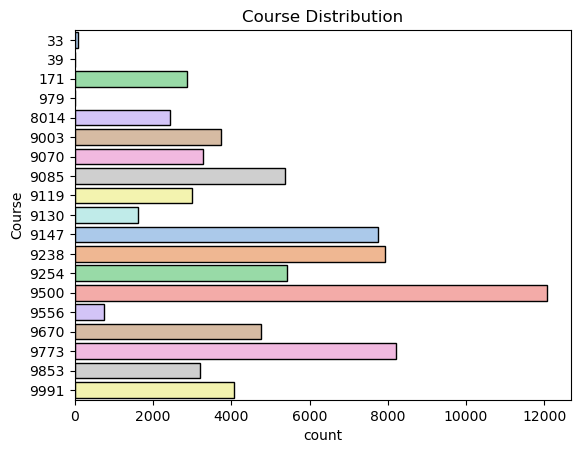

In [10]:
sns.countplot(data = data, y = 'Course', palette = 'pastel', edgecolor = 'black')
plt.title('Course Distribution')
plt.show()

In [11]:
gender_pie = px.pie(data_frame=data,
                     names='Gender',
                     title = 'Gender Distribution (Pie chart)',
                     color_discrete_sequence=colors)
gender_pie.show()

<Axes: xlabel='count', ylabel='Course'>

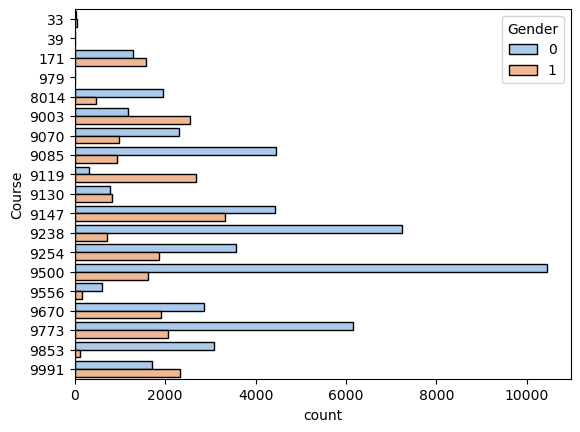

In [12]:
gender = data['Gender'].astype('str')
sns.countplot(data = data, y = 'Course', hue = gender, palette='pastel', edgecolor = 'black')

#### Age Distribution at Enrollment

In [13]:
#Fitting a normal distribution to Age at Enrollment
mu, sigma = stats.norm.fit(data['Age at enrollment'])

#Histogram of Age at enrollment 
hist_data = go.Histogram(x = data['Age at enrollment'], nbinsx=30, name = 'Histogram', opacity = 0.75, histnorm='probability density', marker = dict(color = 'blue'))

#Calculate the normal distribution
x_norm = np.linspace(data['Age at enrollment'].min(), data['Age at enrollment'].max(), 100)
y_norm = stats.norm.pdf(x_norm, mu, sigma)

#Create normal distribution overlay
norm_data = go.Scatter(x=x_norm, y=y_norm, mode="lines", name=f"Normal dist. (μ={mu:.2f}, σ={sigma:.2f})", line=dict(color="green"))

#Combine histogram and overlay
fig3 = go.Figure(data = [hist_data, norm_data])

#Set the layout
fig3.update_layout(
    title = 'Age at Enrollment Distribution',
    xaxis_title = 'Age at Enrollment',
    yaxis_title = 'Density',
    legend_title_text = 'Fitted Normal Distribution'
)

fig3.show()

#### Distribution of Student at nationality

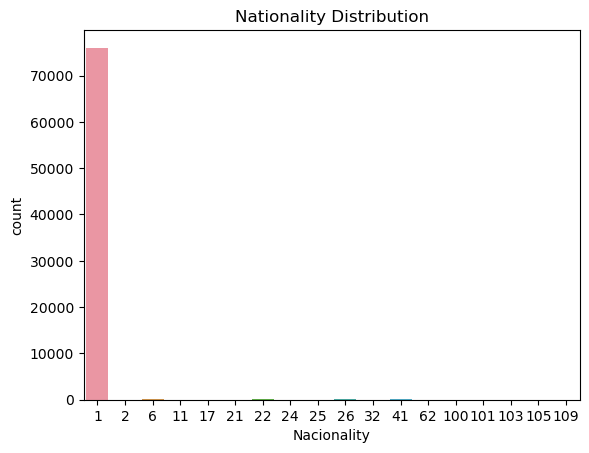

In [14]:
sns.countplot(data = data, x = 'Nacionality')
plt.title('Nationality Distribution')
plt.show()

### 2. Academic Performance

#### Is there a relationship between previous qualifications and the admission grade?

In [15]:
#Correlation between Previous Qualification and Admission grade
prevqual_admission_corr = data['Previous qualification'].corr(data['Admission grade'])
print(f'Correlation between Previous Qualification and Admission Grade: {prevqual_admission_corr}')

#Scatterplot to visualize the relationship between Previous Qualification and Admission Grade
fig5 = px.scatter(data, x = 'Previous qualification', y = 'Admission grade', title = 'Previous Qualification vs Admission Grade', color_continuous_scale=px.colors.sequential.Plasma, color = 'Previous qualification')


#2nd Approach using barplot mean

fig5.show()

Correlation between Previous Qualification and Admission Grade: 0.14338215069862056


#### How does attendance type (daytime/evening) affect students' performance?

In [16]:
#Correlation between Students Performance (Grade) and Attendance type
cor_1st = data['Daytime/evening attendance'].corr(data['Curricular units 1st sem (grade)'])
cor_2nd = data['Daytime/evening attendance'].corr(data['Curricular units 2nd sem (grade)'])
print(f'Correlation between Attendance type and 1st semeter grade: {cor_1st}')
print(f'Correlation between Attendance type and 2nd semeter grade: {cor_2nd}')

fig4 = px.box(data, x = 'Curricular units 1st sem (grade)', color = 'Daytime/evening attendance', title='Attendance type with 1st semester gradde')

fig5 = px.box(data, x = 'Curricular units 2nd sem (grade)', color = 'Daytime/evening attendance', title='Attendance type with 2nd semester gradde')

fig4.show()
fig5.show()


Correlation between Attendance type and 1st semeter grade: 0.11027282175881825
Correlation between Attendance type and 2nd semeter grade: 0.11083707684991848


#### Which course has the highest/lowest average admission grade?<br>

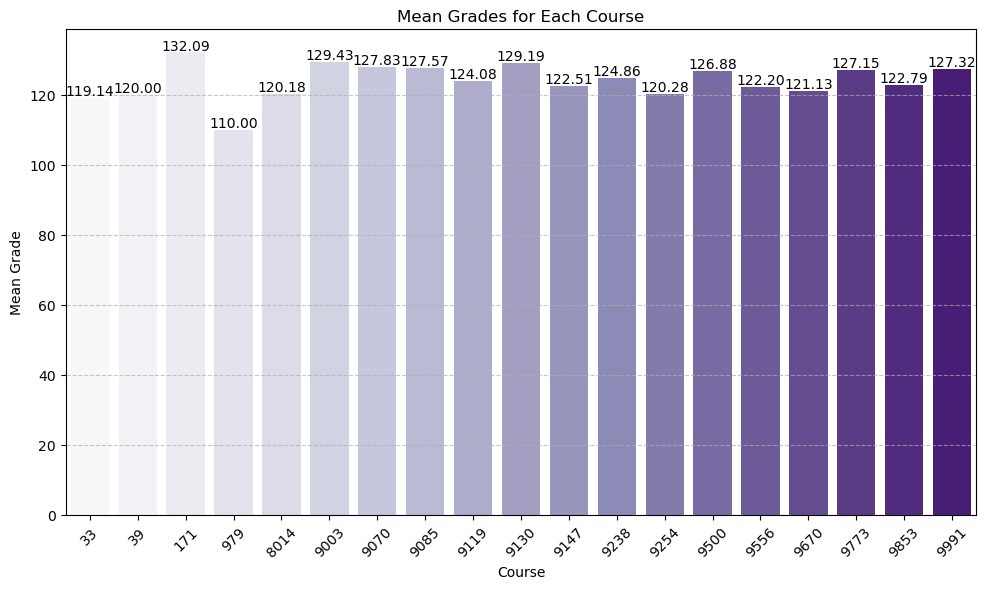

In [17]:
# Calculate mean grades for each course
grades_mean = data.groupby('Course')['Admission grade'].mean().reset_index()
grades_mean.columns = ['Course', 'Mean Grade']

# Create the bar plot
plt.figure(figsize=(10, 6))
bar_plot = sns.barplot(data=grades_mean, x='Course', y='Mean Grade', palette='Purples')

# Add text labels to each bar
for p in bar_plot.patches:
    bar_plot.annotate(format(p.get_height(), '.2f'),
                      (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha='center', va='center',
                      xytext=(0, 5),  # 5 points vertical offset
                      textcoords='offset points')

# Customize plot appearance
plt.title('Mean Grades for Each Course')
plt.xlabel('Course')
plt.ylabel('Mean Grade')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Optional: Add gridlines for better readability
plt.tight_layout()  # Adjust layout to make room for labels

# Show the plot
plt.show()


#### Is there a correlation between the number of enrolled curricular units and the number of approved curricular units?

In [18]:
circular_unit_aprroved_circular_corr = data['Curricular units 1st sem (enrolled)'].corr(data['Curricular units 1st sem (approved)'])
print(f"Correlation between Enrolled curricular unit 1st semeter and approved curricular: {circular_unit_aprroved_circular_corr}")

#Scatter plot to visualize the relationship between Enrolled Curricular unit and Approved Curricular unit
fig6 = px.scatter(data, x = 'Curricular units 1st sem (enrolled)', y = 'Curricular units 1st sem (approved)', color = 'Scholarship holder',color_discrete_sequence=px.colors.sequential.Purp, 
                  title = 'Curricular unit Enrolled vs Approved (1st semester)')
fig6.show()

Correlation between Enrolled curricular unit 1st semeter and approved curricular: 0.5995260967963232


In [19]:
circular_unit_aprroved_circular_corr = data['Curricular units 2nd sem (enrolled)'].corr(data['Curricular units 2nd sem (approved)'])
print(f"Correlation between Enrolled curricular unit 2nd semeter and approved curricular: {circular_unit_aprroved_circular_corr}")

#Scatter plot to visualize the relationship between Enrolled Curricular unit and Approved Curricular unit
fig6 = px.scatter(data, x = 'Curricular units 2nd sem (enrolled)', y = 'Curricular units 2nd sem (approved)', color_discrete_sequence=px.colors.sequential.Bluered, color = 'Scholarship holder',
                  title = 'Curricular unit Enrolled vs Approved (2nd semester)')
fig6.show()

Correlation between Enrolled curricular unit 2nd semeter and approved curricular: 0.5725883558316784


#### How do academic outcomes differ between scholarship holders and non-scholarship holders

In [20]:
#Correlation between Students Performance (Grade) and Attendance type
cor_1st = data['Scholarship holder'].corr(data['Curricular units 1st sem (grade)'])
cor_2nd = data['Scholarship holder'].corr(data['Curricular units 2nd sem (grade)'])
print(f'Correlation between Scholarship holder and 1st semeter grade: {cor_1st}')
print(f'Correlation between Scholarship holder and 2nd semeter grade: {cor_2nd}')

fig7 = px.box(data, x = 'Curricular units 1st sem (grade)', color = 'Scholarship holder', title='Scholarship holder 1st semeter')

fig8 = px.box(data, x = 'Curricular units 2nd sem (grade)', color = 'Scholarship holder', title='Scholarship holder 2nd semeter')

fig7.show()
fig8.show()


Correlation between Scholarship holder and 1st semeter grade: 0.2736422491207081
Correlation between Scholarship holder and 2nd semeter grade: 0.2950949347027527


### 3. Parental Influence

#### Is there a correlation between parents' qualifications and students' academic performance?

In [21]:
#Correlation between father's qualification and student's performance
father_1st = data['Father\'s qualification'].corr(data['Curricular units 1st sem (grade)'])
father_2nd = data['Father\'s qualification'].corr(data['Curricular units 2nd sem (grade)'])
print(f'Father previous qualification and 1st semester grade: {father_1st}')
print(f'Father previous qualification and 2nd semester grade: {father_2nd}')

father_study = data['Father\'s qualification'].astype(float)
father_grades_1st = data.groupby(father_study)['Curricular units 1st sem (grade)'].mean()
fig9 = px.bar(data, x = father_grades_1st.index, y = father_grades_1st, title = "Average 1st semester grade by Father's qualification", text = father_grades_1st.values, color = father_grades_1st.index)
fig9.update_traces(texttemplate = '%{text:,.2f}')
fig9.update_xaxes(title = "Father's qualification")
fig9.update_yaxes(title = 'Average 1st semester grade')
fig9.show()

father_grades_2nd = data.groupby(father_study)['Curricular units 2nd sem (grade)'].mean()
fig10 = px.bar(data, x = father_grades_2nd.index, y = father_grades_2nd, title = "Average 2nd semester grade by Father's qualification", text = father_grades_2nd.values, color = father_grades_2nd.index)
fig10.update_traces(texttemplate = '%{text:,.2f}')
fig10.update_xaxes(title = "Father's qualification")
fig10.update_yaxes(title = 'Average 2nd semester grade')
fig10.show()

Father previous qualification and 1st semester grade: -0.014536185171881431
Father previous qualification and 2nd semester grade: -0.01774115663458139


In [22]:
#Correlation between father's qualification and student's performance
mother_1st = data['Mother\'s qualification'].corr(data['Curricular units 1st sem (grade)'])
mother_2nd = data['Mother\'s qualification'].corr(data['Curricular units 2nd sem (grade)'])
print(f'Mother previous qualification and 1st semester grade: {mother_1st}')
print(f'Mother previous qualification and 2nd semester grade: {mother_2nd}')

mother_study = data['Mother\'s qualification'].astype(float)
mother_grades_1st = data.groupby(mother_study)['Curricular units 1st sem (grade)'].mean()
fig11 = px.bar(data, x = mother_grades_1st.index, y = mother_grades_1st, title = "Average 1st semester grade by Mother's qualification", text = mother_grades_1st.values, color = mother_grades_1st.index)
fig11.update_traces(texttemplate = '%{text:,.2f}')
fig11.update_xaxes(title = "Mother's qualification")
fig11.update_yaxes(title = 'Average 1st semester grade')
fig11.show()

mother_grades_2nd = data.groupby(mother_study)['Curricular units 2nd sem (grade)'].mean()
fig12 = px.bar(data, x = mother_grades_2nd.index, y = mother_grades_2nd, title = "Average 2nd semester grade by Mother's qualification", text = mother_grades_2nd.values, color = mother_grades_2nd.index)
fig12.update_traces(texttemplate = '%{text:,.2f}')
fig12.update_xaxes(title = "Mother's qualification")
fig12.update_yaxes(title = 'Average 2nd semester grade')
fig12.show()

Mother previous qualification and 1st semester grade: -0.0752095171143065
Mother previous qualification and 2nd semester grade: -0.08280460696208501


#### Does the occupation of the mother or father influence the admission grade or overall performance of the student?

In [23]:
data['Mother\'s occupation'].value_counts()

Mother's occupation
9      32386
4      16062
5       9452
3       4644
7       4207
2       4087
0       2206
90       978
6        786
1        766
8        243
191      212
99       138
194       79
141       51
123       44
144       25
192       23
10        18
152       13
193       13
134       11
132       11
175       11
151       11
143        9
153        8
131        6
122        6
173        2
171        1
172        1
11         1
127        1
38         1
163        1
125        1
124        1
103        1
101        1
Name: count, dtype: int64

# Data Preprocessing 

## Splitting Feature and Target

In [24]:
X = data.drop(columns = ['Target'])
y = data['Target']

## Dropping Unrelated Feature

In [25]:
X.drop(columns = ['id'], inplace = True)
X

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
0,1,1,1,9238,1,1,126.0,1,1,19,...,0,0,6,7,6,12.428571,0,11.1,0.6,2.02
1,1,17,1,9238,1,1,125.0,1,19,19,...,0,0,6,9,0,0.000000,0,11.1,0.6,2.02
2,1,17,2,9254,1,1,137.0,1,3,19,...,0,0,6,0,0,0.000000,0,16.2,0.3,-0.92
3,1,1,3,9500,1,1,131.0,1,19,3,...,0,0,8,11,7,12.820000,0,11.1,0.6,2.02
4,1,1,2,9500,1,1,132.0,1,19,37,...,0,0,7,12,6,12.933333,0,7.6,2.6,0.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76513,1,17,1,9254,1,1,121.0,1,19,1,...,0,0,6,8,5,10.600000,0,13.9,-0.3,0.79
76514,1,1,6,9254,1,1,125.0,1,1,38,...,0,0,6,9,6,13.875000,0,9.4,-0.8,-3.12
76515,5,17,1,9085,1,1,138.0,1,37,37,...,2,0,5,8,5,11.400000,1,9.4,-0.8,-3.12
76516,1,1,3,9070,1,1,136.0,1,38,37,...,0,0,6,0,0,0.000000,0,7.6,2.6,0.32


## Encoding Target

In [26]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)
y

array([2, 0, 0, ..., 1, 0, 2])

## Feature Scaling

In [27]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(X)
X

array([[-0.25343684, -0.90242254, -0.52406561, ..., -0.15841825,
        -0.44910992,  0.93317583],
       [-0.25343684,  0.05668196, -0.52406561, ..., -0.15841825,
        -0.44910992,  0.93317583],
       [-0.25343684,  0.05668196,  0.28918253, ...,  1.7636745 ,
        -0.66357837, -0.37269756],
       ...,
       [ 8.80317976,  0.05668196, -0.52406561, ..., -0.79911583,
        -1.44996265, -1.34988173],
       [-0.25343684, -0.90242254,  1.10243066, ..., -1.47750151,
         0.98067968,  0.17807897],
       [-0.25343684, -0.90242254, -0.52406561, ...,  1.49985785,
         1.12365864, -1.76740587]])

## Splitting Training and Test set

In [28]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Modeling

In [29]:
from sklearn.metrics import r2_score

## Linear Regression

In [30]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(X_train, y_train)
y_pred = LR.predict(X_test)
print(f'MLR R2 score: {r2_score(y_test, y_pred)}')

MLR R2 score: 0.7017877718475616


## SVM

In [31]:
# from sklearn.svm import SVR
# svm = SVR(kernel = 'rbf')
# svm.fit(X_train, y_train)
# y_pred = svm.predict(X_test)
# print(f"SVM R2 score: {r2_score(y_test, y_pred)}")

## Random Forest

In [32]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
print(f'Random Forest R2 score: {r2_score(y_test, y_pred)}')

Random Forest R2 score: 0.7360644719116469
